# Taxi Drivers Go Where?
Part 1 - Data Cleaning\
**Part 2 - EDA**\
Part 3 - Time Series Forecast\
Part 4 - Deployment

# Import Library and Packages

In [1]:
from statsmodels.tsa.seasonal import seasonal_decompose
from matplotlib.gridspec import GridSpec
from pmdarima.arima import ADFTest 
from shapely.geometry import Point
from pysal.lib import weights
from datetime import datetime
from folium import plugins
import matplotlib.pyplot as plt
import plotly.express as px
import matplotlib as mpl
import fiona
import geopandas as gpd
import seaborn as sns
import pandas as pd
import numpy as np
import statistics
import calendar
import folium
import pysal
import time
import math
import json

import warnings
%matplotlib inline
warnings.filterwarnings("ignore")
pd.set_option('display.max_columns', None)
pd.options.display.float_format = '{:,.2f}'.format
np.set_printoptions(threshold=np.inf)

/Users/yijunang/mambaforge/envs/geoenv/lib/python3.9/site-packages/geopandas/_compat.py:123: UserWarning: The Shapely GEOS version (3.11.1-CAPI-1.17.1) is incompatible with the GEOS version PyGEOS was compiled with (3.10.3-CAPI-1.16.1). Conversions between both will be slow.
  warnings.warn(


# Import Datasets

## Taxi Datasets from Jan 2022 to October 2022

In [2]:
y_22 = pd.read_pickle('./datasets/cleaned_yellow_2022.pkl')

In [3]:
print(y_22.shape)
y_22.head()

(25348245, 4)


,tpep_pickup_datetime,tpep_dropoff_datetime,PULocationID,DOLocationID
0,2022-01-01 00:00:08,2022-01-01 00:14:14,138,255
1,2022-01-01 00:00:11,2022-01-01 00:14:29,132,215
2,2022-01-01 00:00:17,2022-01-01 00:31:04,170,68
3,2022-01-01 00:00:18,2022-01-01 00:13:27,79,209
4,2022-01-01 00:00:20,2022-01-01 00:20:51,68,256


## New York City Geographical Dataset

The zoning maps are downloaded from https://data.cityofnewyork.us/Transportation/NYC-Taxi-Zones/d3c5-ddgc. The SHP files contains the longitude and latitude information which was not found in the nyc.gov

In [4]:
# Load the New York Map Dataset as GEO Dataframe
geo_df = gpd.read_file("./datasets/taxi_zones/geo_export_457dd3df-f007-4b2c-9373-8ac7fde74fb4.shp") 

print(geo_df.shape)
geo_df.head()

(263, 7)


,borough,location_i,objectid,shape_area,shape_leng,zone,geometry
0,EWR,1.00,1.00,0.00,0.12,Newark Airport,"POLYGON ((-74.18445 40.69500, -74.18449 40.695..."
1,Queens,2.00,2.00,0.00,0.43,Jamaica Bay,"MULTIPOLYGON (((-73.82338 40.63899, -73.82277 ..."
2,Bronx,3.00,3.00,0.00,0.08,Allerton/Pelham Gardens,"POLYGON ((-73.84793 40.87134, -73.84725 40.870..."
3,Manhattan,4.00,4.00,0.00,0.04,Alphabet City,"POLYGON ((-73.97177 40.72582, -73.97179 40.725..."
4,Staten Island,5.00,5.00,0.00,0.09,Arden Heights,"POLYGON ((-74.17422 40.56257, -74.17349 40.562..."


### Rename LocationID

In [5]:
geo_df.rename(columns = {"location_i" : "LocationID"}, inplace = True)
geo_df.head()

,borough,LocationID,objectid,shape_area,shape_leng,zone,geometry
0,EWR,1.00,1.00,0.00,0.12,Newark Airport,"POLYGON ((-74.18445 40.69500, -74.18449 40.695..."
1,Queens,2.00,2.00,0.00,0.43,Jamaica Bay,"MULTIPOLYGON (((-73.82338 40.63899, -73.82277 ..."
2,Bronx,3.00,3.00,0.00,0.08,Allerton/Pelham Gardens,"POLYGON ((-73.84793 40.87134, -73.84725 40.870..."
3,Manhattan,4.00,4.00,0.00,0.04,Alphabet City,"POLYGON ((-73.97177 40.72582, -73.97179 40.725..."
4,Staten Island,5.00,5.00,0.00,0.09,Arden Heights,"POLYGON ((-74.17422 40.56257, -74.17349 40.562..."


The new LocationID is not in accordance to the zoning in the Yellow Taxi Dataset as the lowest ID starts from 0. Hence, the LocationID is manually adjusted by adding 1 to all ID

### Zones with Duplicate Names

In [6]:
geo_df.loc[geo_df.duplicated(subset = ['zone']),:]

,borough,LocationID,objectid,shape_area,shape_leng,zone,geometry
56,Queens,56.00,57.00,0.00,0.02,Corona,"POLYGON ((-73.85131 40.74984, -73.85443 40.748..."
104,Manhattan,103.00,104.00,0.00,0.02,Governor's Island/Ellis Island/Liberty Island,"POLYGON ((-74.03995 40.70089, -74.03945 40.700..."
105,Manhattan,103.00,105.00,0.00,0.08,Governor's Island/Ellis Island/Liberty Island,"POLYGON ((-74.01675 40.69334, -74.01540 40.693..."


To avoid ease the weights assignment, the zones with duplicated names will be renamed with interger for ease of recognition.

In [7]:
geo_df.at[56,'zone']='Corona_1'
geo_df.at[104,'zone']="Governor's Island/Ellis Island/Liberty Island_1"
geo_df.at[105,'zone']="Governor's Island/Ellis Island/Liberty Island_2"

In [8]:
# Cross check on the duplicaeted values
geo_df.loc[geo_df.duplicated(subset = ['zone']),:]

,borough,LocationID,objectid,shape_area,shape_leng,zone,geometry


### Identify the LocationIDs between Both Dataset

In [9]:
print(f'The number of unique Pick Up Zone: {y_22["PULocationID"].nunique()}')
print(f'The number of unique Drop Off Zone: {y_22["DOLocationID"].nunique()}')
print(f'The number of unique Zone in Map: {geo_df["LocationID"].nunique()}')

The number of unique Pick Up Zone: 260
The number of unique Drop Off Zone: 260
The number of unique Zone in Map: 260


In [10]:
geo_PU = set(geo_df['LocationID']).difference(set(y_22['PULocationID']))
geo_DO = set(geo_df['LocationID']).difference(set(y_22['DOLocationID']))
PU_geo = set(y_22['PULocationID']).difference(set(geo_df['LocationID']))
DO_geo = set(y_22['DOLocationID']).difference(set(geo_df['LocationID']))

In [11]:
print(geo_PU)
print(geo_DO)
print(PU_geo)
print(DO_geo)

{110.0, 103.0}
{199.0, 103.0}
{57, 105}
{57, 105}


Inference:

Based on the findings above, we could see that the number of zonings covered in both PU or DO are different. There are a total of 263 zones in New York but only 260 zones had taxis. For Zone 1, it was intentionally removed from the PU Location as that Zone 1 is Newark Airport which is located outside of New York City.

Also, it is safe to say that the zoning in Map covers all the zones in the dataset

In [12]:
print(y_22[(y_22["DOLocationID"] == 104) | (y_22["PULocationID"] == 104)].shape)
print(y_22[(y_22["DOLocationID"] == 110) | (y_22["PULocationID"] == 110)].shape)
print(y_22[(y_22["DOLocationID"] == 103) | (y_22["PULocationID"] == 103)].shape)
print(y_22[(y_22["DOLocationID"] == 199) | (y_22["PULocationID"] == 199)].shape)

(0, 4)
(2, 4)
(0, 4)
(9, 4)


Inference:

With output from above, Zone 104 and Zone 103 had zero taxi in the zone. This could be due to the zones are island and isolated.

As for Zone 110, only 2 trips were made to that zones while Zone 199 had 2 trips from that zone.

# EDA

## Data Preparation

### Frequency of Taxi by Location ID

In [13]:
%%time
# To extract the pickup and dropoff frequency based on zones

# Define an empty dictionary to store the new DataFrame
PickUp = {}
DropOff = {}

# Define empty dataframe to store the frequencies 
IDCount = pd.DataFrame()

# Each unique Pick Up Loaction ID is stored in the Dictionary for timeseries training
for ID in (sorted(y_22['PULocationID'].unique())):
    
    # define emoty datafrane for the new ID
    PickUp[ID] = pd.DataFrame()
    DropOff[ID] = pd.DataFrame()
    
    # extract rows where ID matches with the PULocationID
    PickUp[ID] = y_22[y_22['PULocationID'] == ID]
    DropOff[ID] = y_22[y_22['DOLocationID'] == ID]
    
    # Define the aggregated frequency in dataframe
    summ = pd.DataFrame({'LocationID': ID,
                         'PUFreq': PickUp[ID].shape[0],
                         'DOFreq': DropOff[ID].shape[0]},
                        index = [0])
    
    # Concat the dataframe
    IDCount = pd.concat([IDCount, summ])

# Reset index 
IDCount.reset_index(drop = True, inplace = True)

CPU times: user 5.27 s, sys: 1.22 s, total: 6.49 s
Wall time: 6.76 s


In [14]:
# Return Zones with higherst PickUp Frequency
IDCount.sort_values(by =['PUFreq'], ascending = False).head()

,LocationID,PUFreq,DOFreq
233,237,1201458,1040297
128,132,1138832,292567
232,236,1069860,1097422
157,161,1034435,931335
182,186,854275,580963


### Geospatial Data with Coordinates & Counts

In [15]:
# Identify the central coordinate from the geometry shape
geo_df['coords'] = geo_df['geometry'].apply(lambda x: x.representative_point().coords[:])
geo_df['coords'] = [coords[0] for coords in geo_df['coords']]

# To split the coordinate into Longitude and Latitude 
geo_df = pd.concat([geo_df, geo_df['coords'].astype("string").str.split(', ', expand=True)], axis=1)
geo_df.rename(columns = {0:'longitude', 1:'latitude'}, inplace = True)
geo_df['longitude'] = geo_df['longitude'].str.replace('(', '')
geo_df['latitude'] = geo_df['latitude'].str.replace(')', '')

geo_df.head()

,borough,LocationID,objectid,shape_area,shape_leng,zone,geometry,coords,longitude,latitude
0,EWR,1.00,1.00,0.00,0.12,Newark Airport,"POLYGON ((-74.18445 40.69500, -74.18449 40.695...","(-74.17677842004377, 40.689514999999886)",-74.17677842004377,40.689514999999886
1,Queens,2.00,2.00,0.00,0.43,Jamaica Bay,"MULTIPOLYGON (((-73.82338 40.63899, -73.82277 ...","(-73.82614118027297, 40.62572435264643)",-73.82614118027297,40.62572435264643
2,Bronx,3.00,3.00,0.00,0.08,Allerton/Pelham Gardens,"POLYGON ((-73.84793 40.87134, -73.84725 40.870...","(-73.84947945770672, 40.865871161999934)",-73.84947945770672,40.865871161999934
3,Manhattan,4.00,4.00,0.00,0.04,Alphabet City,"POLYGON ((-73.97177 40.72582, -73.97179 40.725...","(-73.97702362880241, 40.72415107077562)",-73.97702362880241,40.72415107077562
4,Staten Island,5.00,5.00,0.00,0.09,Arden Heights,"POLYGON ((-74.17422 40.56257, -74.17349 40.562...","(-74.18993821824958, 40.55033924549989)",-74.18993821824958,40.55033924549989


In [16]:
count_geo_df = geo_df.join(IDCount.set_index('LocationID'), on = 'LocationID')
count_geo_df.head()

,borough,LocationID,objectid,shape_area,shape_leng,zone,geometry,coords,longitude,latitude,PUFreq,DOFreq
0,EWR,1.00,1.00,0.00,0.12,Newark Airport,"POLYGON ((-74.18445 40.69500, -74.18449 40.695...","(-74.17677842004377, 40.689514999999886)",-74.17677842004377,40.689514999999886,"1,052.00","64,255.00"
1,Queens,2.00,2.00,0.00,0.43,Jamaica Bay,"MULTIPOLYGON (((-73.82338 40.63899, -73.82277 ...","(-73.82614118027297, 40.62572435264643)",-73.82614118027297,40.62572435264643,22.00,18.00
2,Bronx,3.00,3.00,0.00,0.08,Allerton/Pelham Gardens,"POLYGON ((-73.84793 40.87134, -73.84725 40.870...","(-73.84947945770672, 40.865871161999934)",-73.84947945770672,40.865871161999934,259.00,"1,716.00"
3,Manhattan,4.00,4.00,0.00,0.04,Alphabet City,"POLYGON ((-73.97177 40.72582, -73.97179 40.725...","(-73.97702362880241, 40.72415107077562)",-73.97702362880241,40.72415107077562,"31,160.00","105,190.00"
4,Staten Island,5.00,5.00,0.00,0.09,Arden Heights,"POLYGON ((-74.17422 40.56257, -74.17349 40.562...","(-74.18993821824958, 40.55033924549989)",-74.18993821824958,40.55033924549989,271.00,321.00


In [17]:
count_geo_df[count_geo_df['PUFreq'].isna()]

,borough,LocationID,objectid,shape_area,shape_leng,zone,geometry,coords,longitude,latitude,PUFreq,DOFreq
103,Manhattan,103.00,103.00,0.00,0.01,Governor's Island/Ellis Island/Liberty Island,"POLYGON ((-74.04389 40.69018, -74.04351 40.689...","(-74.04518066253948, 40.68985960423434)",-74.04518066253948,40.68985960423434,NaN,NaN
104,Manhattan,103.00,104.00,0.00,0.02,Governor's Island/Ellis Island/Liberty Island_1,"POLYGON ((-74.03995 40.70089, -74.03945 40.700...","(-74.03913070563104, 40.6986725112194)",-74.03913070563104,40.6986725112194,NaN,NaN
105,Manhattan,103.00,105.00,0.00,0.08,Governor's Island/Ellis Island/Liberty Island_2,"POLYGON ((-74.01675 40.69334, -74.01540 40.693...","(-74.01879335091732, 40.688138600649935)",-74.01879335091732,40.688138600649935,NaN,NaN
110,Staten Island,110.00,110.00,0.00,0.10,Great Kills Park,"POLYGON ((-74.11813 40.55059, -74.11656 40.549...","(-74.12584854600858, 40.5432654296599)",-74.12584854600858,40.5432654296599,NaN,NaN


Inference:

We could see there are 3 zones with null values. This could be due to the area has no taxi ride being picked up or dropped off before. Or this area could be covered by Yellow Taxi and operated by other taxi operators. Hence, these null values will be replaced with 0.

In [18]:
count_geo_df['PUFreq'] = count_geo_df['PUFreq'].fillna(0)

Deduce the demand feature

In [19]:
count_geo_df['demand'] = count_geo_df['PUFreq'] - count_geo_df['DOFreq'] 

### Grouby the count values by time interval

In [20]:
# Grouby by Month
y_22_m = pd.DataFrame(y_22.groupby(pd.Grouper(key = 'tpep_pickup_datetime', freq='M')).count())

# Grouby by Week
y_22_w = pd.DataFrame(y_22.groupby(pd.Grouper(key = 'tpep_pickup_datetime', freq='W')).count())

# Grouby by Day
y_22_d = pd.DataFrame(y_22.groupby(pd.Grouper(key = 'tpep_pickup_datetime', freq='D')).count())

# Grouby by Hour
y_22_h = pd.DataFrame(y_22.groupby(pd.Grouper(key = 'tpep_pickup_datetime', freq='H')).count())

# Grouby by 5Min
y_22_5m = pd.DataFrame(y_22.groupby(pd.Grouper(key = 'tpep_pickup_datetime', freq='5Min')).count())

### Groupby the count value by time interval and zone and deduce 'demand'

In [21]:
'''
- Subdivide the PickUp and DropOff timing based on Zoning
- Identify the 'demand' by substrating the PickUp count with Dropoff count
- Remove all null values to zero
- Convert the datatypes to float16 to reduce the size of dictionary
'''
def zoning(period):
    # define empty dictionary
    zone = {}
    PU = {}
    DO = {}

    for ID in (sorted(y_22['PULocationID'].unique())):
        # To groupby the date time column into 1 hour segment and aggregate the value with number of pick up for that location in that period
        PU[ID] = pd.DataFrame(PickUp[ID].groupby(pd.Grouper(key = 'tpep_pickup_datetime', freq=period)).count())
        DO[ID] = pd.DataFrame(DropOff[ID].groupby(pd.Grouper(key = 'tpep_dropoff_datetime', freq=period)).count())

        # To define a DataFrame with number of count in the period
        zone[ID] = pd.DataFrame()
        zone[ID]['PUCount'] = PU[ID]['PULocationID']
        zone[ID]['DOCount'] = DO[ID]['DOLocationID']

        # To convert all Nan to 0
        zone[ID].replace(np.nan, 0, inplace = True)

        # Feature engineer the demand of taxi in the zone at the same time
        zone[ID]['demand'] = zone[ID]['PUCount'] - zone[ID]['DOCount']

        # Convert the datatype to reduce data size
        for col in zone[ID].columns:
            c_min = zone[ID][col].min()
            c_max = zone[ID][col].max()
            if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                zone[ID][col] = zone[ID][col].astype(np.float32)
            elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                zone[ID][col] = zone[ID][ID][col].astype(np.float32)
            else:
                zone[ID][col] = zone[ID][col].astype(np.float64)

        # Rename the index
        zone[ID].index.names = ['datetime']
        
    return zone

## Visualization

### Data Staionary Check

In [22]:
# Augmented Dickey-Fuller test on our original monthly data as that was ambiguous to confirm stationarity
adf_test = ADFTest(alpha = 0.05) # instantiate ADF test with setting the threshold for p-value to accept/reject null hypothesis

# ADF test run using this function to tell should the df.diff() be called or not on the data passed
adf_test.should_diff(y_22_5m['PULocationID']) 

(0.01, False)

Inference:

 𝑝 -value is 0.01. With this, we could reject the null hypothesis based on this statistical proof and confirm that our data is already stationary.

### Zone Visualization

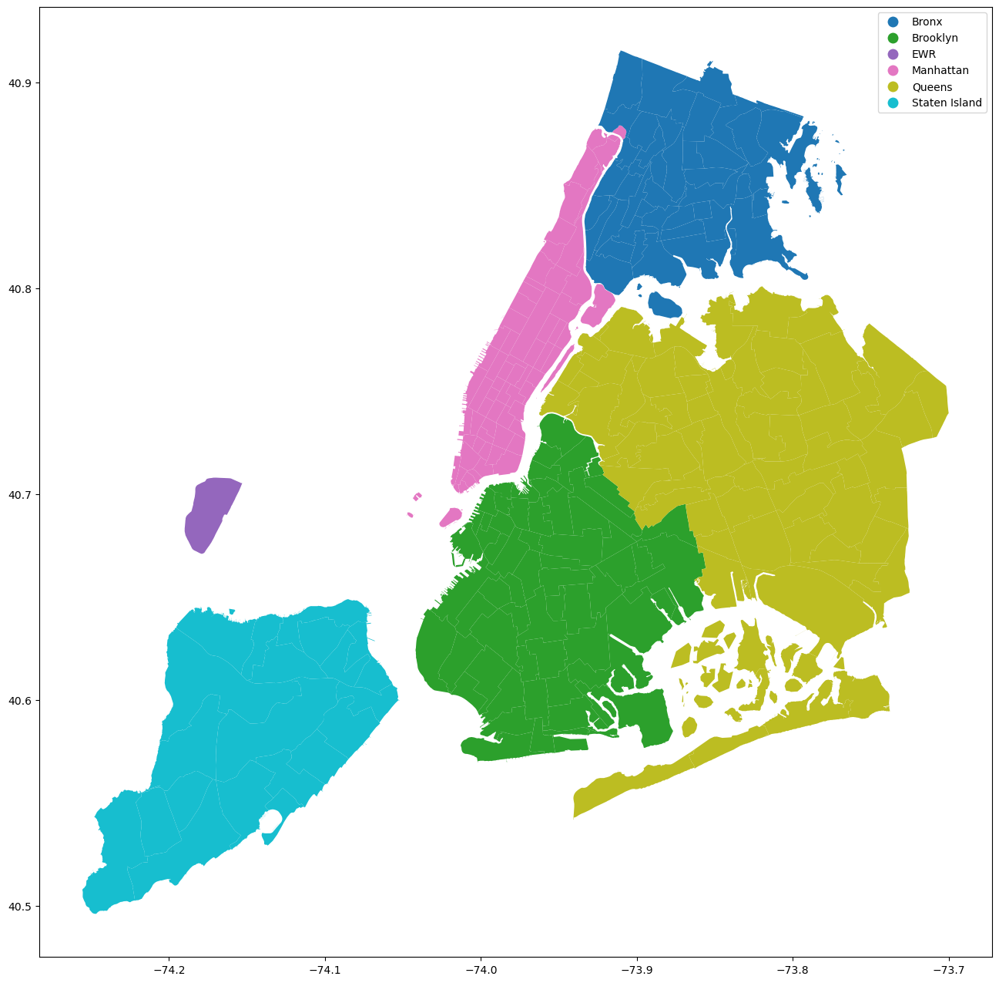

In [23]:
# legend_settings = {'loc': 'upper left', 'ncol': 5, 'bbox_to_anchor':(1,1)}
geo_df.plot(column='borough', figsize = (20,16), legend=True);
plt.savefig('./image/map_borough.jpg')

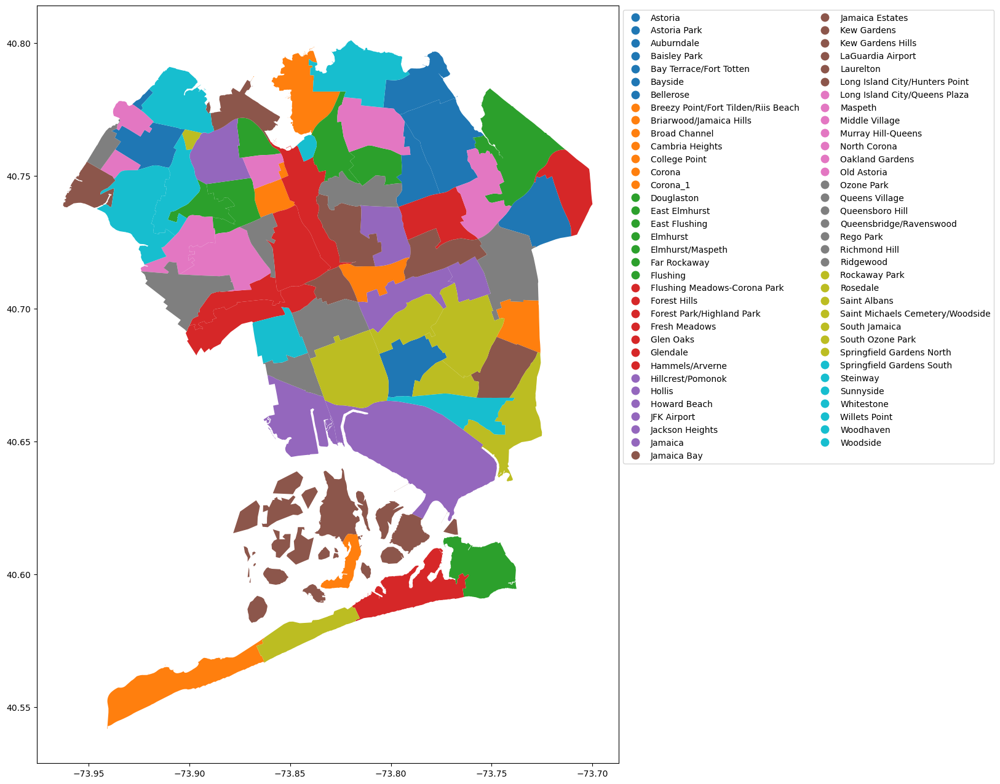

In [24]:
# Show only the Queens Borough
geo_df_b = geo_df[geo_df["borough"] == 'Queens']
legend_settings = {'loc': 'upper left', 'ncol': 2, 'bbox_to_anchor':(1,1)}
geo_df_b.plot(column='zone', figsize = (20,16), legend=True, legend_kwds = legend_settings);
plt.savefig('./image/map_borough_queens.jpg')

### Taxi Ride Pick Up Frequency

In [25]:
map1 = folium.Map(location=[40.7128, -74.0060], 
                 tiles="Cartodb dark_matter", zoom_start=10)

for _, r in count_geo_df.iterrows():
    sim_geo = gpd.GeoSeries(r['geometry']).simplify(tolerance=0.001)
    geo_j = sim_geo.to_json()
    geo_j = folium.GeoJson(data=geo_j,
                           style_function=lambda x: {'fillColor': 'orange'})
    folium.Popup(r['zone']).add_to(geo_j)
    geo_j.add_to(map1)
    
for i in range(0,len(count_geo_df)):
   folium.CircleMarker(
      location=[count_geo_df.iloc[i]['latitude'], count_geo_df.iloc[i]['longitude']],
      popup= count_geo_df.iloc[i]['zone'],
      radius= float(count_geo_df.iloc[i]['PUFreq'])*0.00003,
      color='#69b3a2',
      fill=True,
      fill_color='#E31A1C'
   ).add_to(map1)

map1

### Taxi Ride Drop Off Frequency

In [26]:
map2 = folium.Map(location=[40.7128, -74.0060], 
                 tiles="Cartodb dark_matter", zoom_start=10)

for _, r in count_geo_df.iterrows():
    sim_geo = gpd.GeoSeries(r['geometry']).simplify(tolerance=0.001)
    geo_j = sim_geo.to_json()
    geo_j = folium.GeoJson(data=geo_j,
                           style_function=lambda x: {'fillColor': 'orange'})
    folium.Popup(r['zone']).add_to(geo_j)
    geo_j.add_to(map2)
    
for i in range(0,len(count_geo_df)):
   folium.CircleMarker(
      location=[count_geo_df.iloc[i]['latitude'], count_geo_df.iloc[i]['longitude']],
      popup= count_geo_df.iloc[i]['zone'],
      radius= float(count_geo_df.iloc[i]['DOFreq'])*0.00003,
      color='#A6CEE3',
      fill=True,
      fill_color='#A6CEE3'
   ).add_to(map2)

map2

In [27]:
map4 = folium.Map(location=[40.7128, -74.0060], 
                 tiles="Cartodb dark_matter", zoom_start=10)
    
# To plot the choropleth to show Pick Up Frequency by states throughout the year
folium.Choropleth(
   geo_data=count_geo_df,
   data=count_geo_df,
   columns=['zone',"PUFreq"],
   key_on="feature.properties.zone",
   fill_color='YlGnBu',
   fill_opacity=1,
   line_opacity=0.2,
   legend_name="PUFreq",
   smooth_factor=0,
   Highlight= True,
   line_color = "#0000",
   name = "PUFreq",
   show=False,
   overlay=True,
   nan_fill_color = "White"
).add_to(map4)

# Plot in the geometry boundary
for _, r in count_geo_df.iterrows():
    sim_geo = gpd.GeoSeries(r['geometry']).simplify(tolerance=0.0001)
    geo_j = sim_geo.to_json()
    geo_j = folium.GeoJson(data=geo_j,
                           style_function=lambda x: {'fillColor': 'none'})
    popup_string = 'Zone: {} <br>Pick Up Freq: {}'.format(r['zone'], r['PUFreq'])
    folium.Popup(popup_string, min_width=150, max_width=300).add_to(geo_j)
    geo_j.add_to(map4)

map4

In [28]:
map5 = folium.Map(location=[40.7128, -74.0060], 
                 tiles="Cartodb dark_matter", zoom_start=10)
    
# To plot the choropleth to show Pick Up Frequency by states throughout the year
folium.Choropleth(
   geo_data=count_geo_df,
   data=count_geo_df,
   columns=['zone',"DOFreq"],
   key_on="feature.properties.zone",
   fill_color='YlOrBr',
   fill_opacity=1,
   line_opacity=0.2,
   legend_name="DOFreq",
   smooth_factor=0,
   Highlight= True,
   line_color = "#0000",
   name = "DOFreq",
   show=False,
   overlay=True,
   nan_fill_color = "White"
).add_to(map5)

# Plot in the geometry boundary
for _, r in count_geo_df.iterrows():
    # Without simplifying the representation of each borough,
    # the map might not be displayed
    sim_geo = gpd.GeoSeries(r['geometry']).simplify(tolerance=0.0001)
    geo_j = sim_geo.to_json()
    geo_j = folium.GeoJson(data=geo_j,
                           style_function=lambda x: {'fillColor': 'white'})
    popup_string = 'Zone: {} <br>Drop Off Freq: {}'.format(r['zone'], r['DOFreq'])
    folium.Popup(popup_string, min_width=150, max_width=300).add_to(geo_j)
    geo_j.add_to(map5)

map5

### Frequency of Taxi Ride by Month

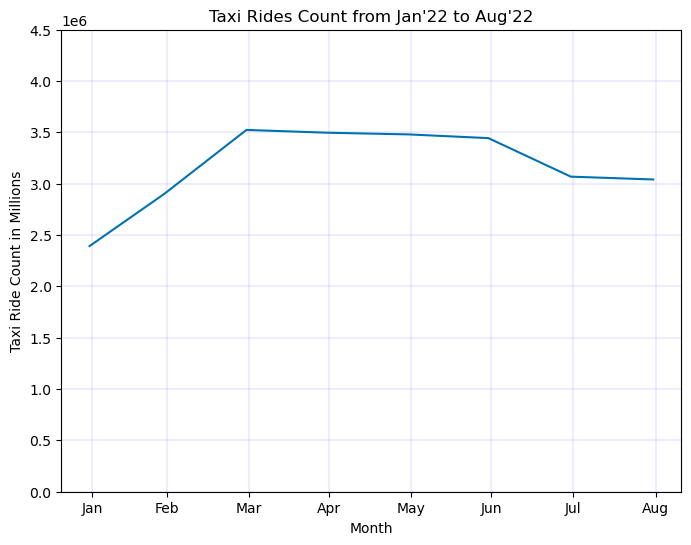

<Figure size 640x480 with 0 Axes>

In [29]:
# Convert the month from numeric to Name in Alphabet
label_month = []
label_num = pd.DatetimeIndex(y_22_m.index).month
for i in label_num:
    label_month.append(calendar.month_abbr[i])

# Set the Plot Style
plt.style.use('seaborn-colorblind')
    
    
# Plot the line chart
fig, ax = plt.subplots(figsize = (8,6))
sns.lineplot(data=y_22_m[:-1], x= y_22_m.index[:-1], 
             y= "PULocationID", ax = ax,
            ).set(title = "Taxi Rides Count from Jan'22 to Aug'22")
plt.ylim(0, 4500000)
ax.set_xticklabels(label_month)
plt.xlabel('Month')
plt.ylabel('Taxi Ride Count in Millions')
plt.grid(color='b', linestyle='-', linewidth=0.1)
plt.show()
plt.savefig('./image/taxi_ride_jan_aug.jpg')

### Frequency of Taxi Ride by Hour

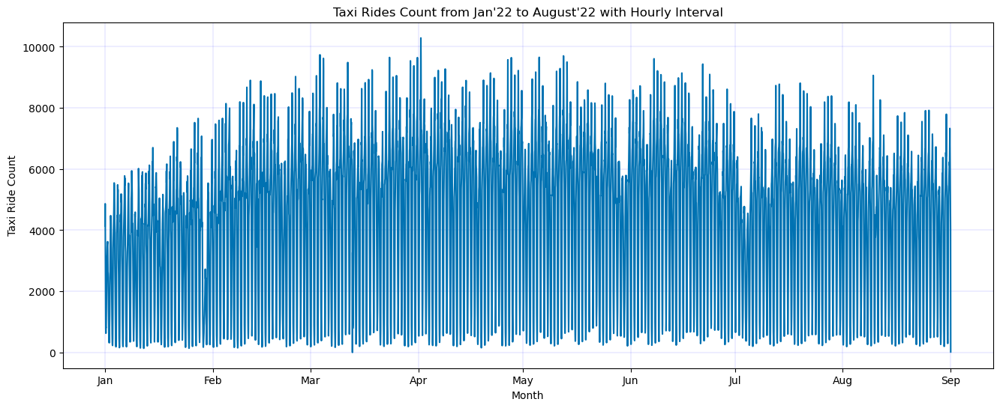

<Figure size 640x480 with 0 Axes>

In [30]:
# Plot the line chart
fig, ax = plt.subplots(figsize = (16,6))
sns.lineplot(data=y_22_h, x= y_22_h.index, 
             y= "PULocationID", ax = ax
            ).set(title = "Taxi Rides Count from Jan'22 to August'22 with Hourly Interval")
ax.set_xticklabels(label_month)
plt.xlabel('Month')
plt.ylabel('Taxi Ride Count')
plt.grid(color='b', linestyle='-', linewidth=0.1)
plt.show()
plt.savefig('./image/taxi_freq_jan_aug.jpg')

In [31]:
y_22_h_8 = y_22_h[y_22_h.index.month == 8]

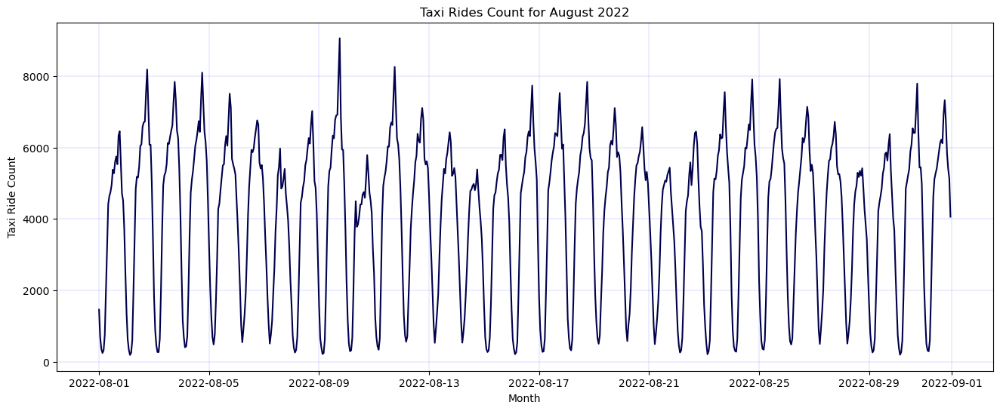

<Figure size 640x480 with 0 Axes>

In [32]:
# Plot the line chart
fig, ax = plt.subplots(figsize = (16,6))
sns.lineplot(data=y_22_h_8, x= y_22_h_8.index, 
             y= "PULocationID", ax = ax, color = '#00004c'
            ).set(title = "Taxi Rides Count for August 2022")
# ax.set_xticklabels(label_month)
plt.xlabel('Month')
plt.ylabel('Taxi Ride Count')
plt.grid(color='b', linestyle='-', linewidth=0.1)
plt.show()
plt.savefig('./image/taxi_freq_aug.jpg')

### Seasonal Decompose Charts

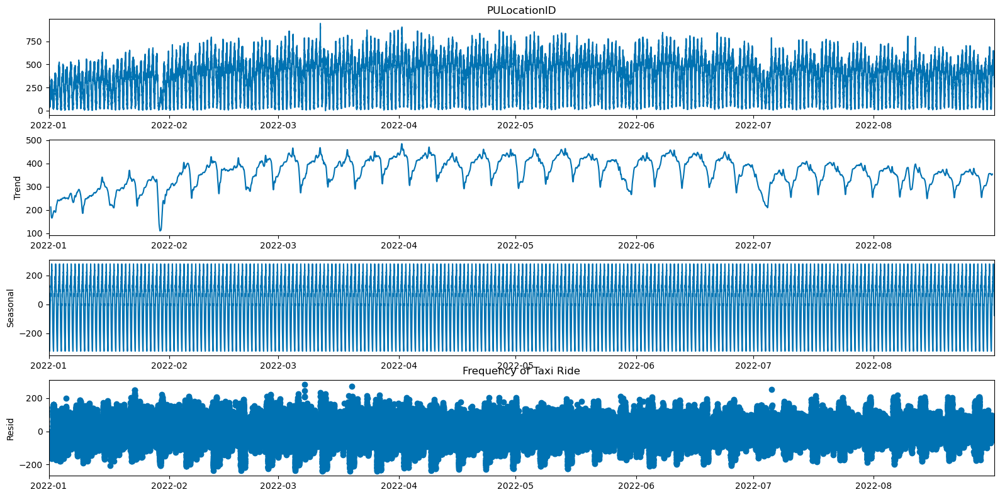

<Figure size 640x480 with 0 Axes>

In [33]:
seas_decom = seasonal_decompose(y_22_5m.loc['2022-01':'2022-08', 'PULocationID'], model='additive', period=12*24)

fig = seas_decom.plot()
fig.set_size_inches((16, 8))
fig.tight_layout()
plt.title('Frequency of Taxi Ride')
plt.show()
plt.savefig('./image/taxi_freq_week_seasonal_decompose.jpg')

Inference:

The data is broken down into four charts above which are:

|Component|Description|
|:-------------------:|:------------|
|Original Value|Data from dataset |
|Trend|The general direction of the series over a period of time. Trend is calculated using a centered moving average of the time series. The moving average is calculated using a window length corresponding to the frequency of the time series.|
|Seasonality|Distinct and Repeating pattern observed in regular intervals. Calculate the average values of the detrended series for each seasonal period. In the additive decomposition the detrended series is centered at zero|
|Residual|The irrefular component consisting of the fluctuations in the time series after removing the previous components|

**Trend**\
With the Period of 1 day or 24 hours, we could see a very strong trend from the dataset. It is obvious that the dataset has weekly trend line where we could see a cyclical trend on every 7 days. It is noticable that there are some outliers which are on the date:
- 29 Jan - No special event. This data could be missing due to technical issue
- 29 May - Memorial Day
- 04 July - National Day
- 10 August - No special event. This data could be missing due to technical issue

**Seasonal**\
We could see that there is definitely seasonality in the data and the fluctuate is approximately 300 over the day.

**Residual**\
Residuals are consistent and range around 200 from zero values.




Inference:

We could see a pattern in the taxi rides count where it oscillates on daily basis. 

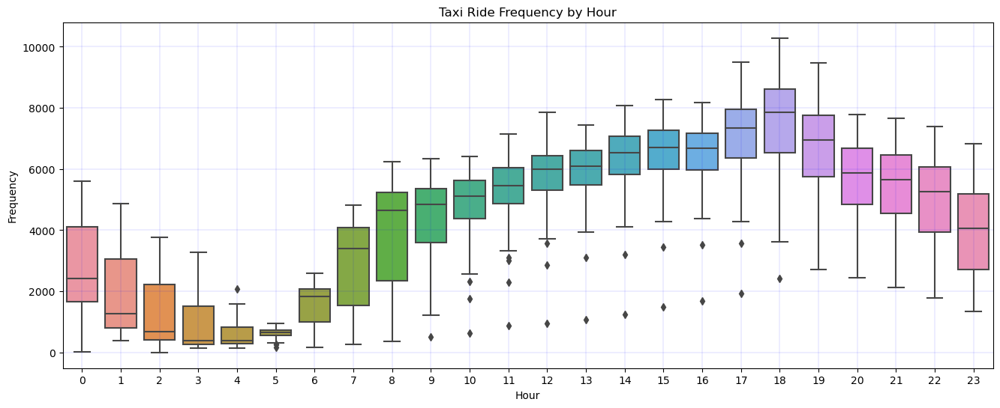

In [34]:
fig, ax = plt.subplots(figsize = (16,6))
sns.boxplot(data = y_22_h, y = y_22_h['PULocationID'], x = y_22_h.index.hour, ax = ax
               ).set(title = 'Taxi Ride Frequency by Hour')
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10)
plt.xlabel('Hour')
plt.ylabel('Frequency')
plt.grid(color='b', linestyle='-', linewidth=0.1)
plt.show()



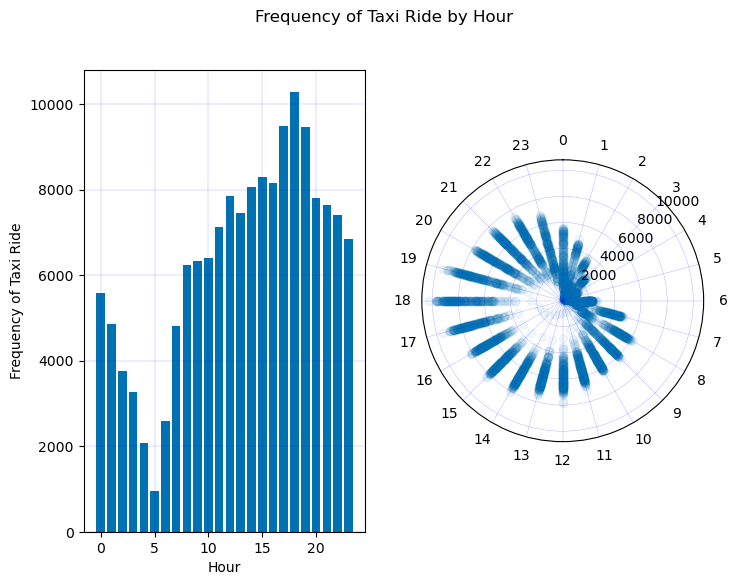

<Figure size 640x480 with 0 Axes>

In [35]:
# Compute areas and colors
y_22_h['time'] = y_22_h.index.hour
y_22_h['hour_rad'] = y_22_h['time'].apply(lambda t: np.deg2rad(t*15))
color_list = ["#A6CEE3", "#1F78B4", "#B2DF8A", "#33A02C", "#FB9A99", "#E31A1C", 
              "#FDBF6F", "#FF7F00", "#CAB2D6", "#6A3D9A", "#FFFF99", "#B15928"]

fig = plt.figure(figsize = (8,6))
gs = GridSpec(nrows=1, ncols=2, width_ratios=[1, 1])

ax1 = fig.add_subplot(gs[0,0])
ax1.bar(x = y_22_h.index.hour, height = y_22_h['PULocationID'], edgecolor = 'none')
ax1.set_ylabel('Frequency of Taxi Ride')
ax1.set_xlabel('Hour')
ax1.grid(color='b', linestyle='-', linewidth=0.1)

ax2 = fig.add_subplot(gs[0,1], projection='polar')
ax2.scatter(y_22_h['hour_rad'], y_22_h['PULocationID'], alpha=0.05)
ax2.set_rlabel_position(45)
ax2.set_xticks(np.linspace(0, 2*np.pi, 24, endpoint=False))
ax2.set_xticklabels(range(24))
ax2.set_theta_direction(-1)
ax2.set_theta_offset(np.pi/2.0)
ax2.grid(color='b', linestyle='-', linewidth=0.1)

plt.suptitle('Frequency of Taxi Ride by Hour')
plt.show()
plt.savefig('./image/taxi_freq_hour.jpg')

With the boxplot, bar chart and the polar charts, it is clear that we could see a very strong daily trend on the frequency of taxi rides. The taxi ride frequencies slowly increase from 5AM in the morning and peak at 6PM and slowly decrease again to 5AM.

It is worth higlighted that the highest peak of taxi rides happens at 6PM and the the lowest peak occured at 5AM. This trend shows that taxi ride frequency happens more often during the day and espcially 6PM where it is the end of the business day.

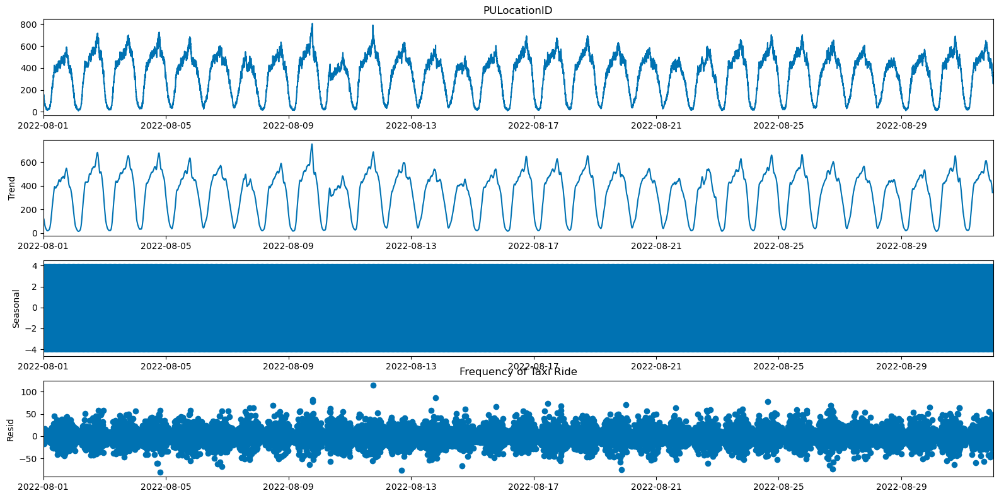

<Figure size 640x480 with 0 Axes>

In [36]:
seas_decom = seasonal_decompose(y_22_5m.loc['2022-08':'2022-08', 'PULocationID'], model='additive', period=12)

fig = seas_decom.plot()
fig.set_size_inches((16, 8))
fig.tight_layout()
plt.title('Frequency of Taxi Ride')
plt.show()
plt.savefig('./image/taxi_freq_day_seasonal_decompose.jpg')

Inference:

**Trend**\
With the Period of 1 hour or 60 Minutes, we could see a very strong trend from the dataset. It is obvious that the dataset has daily trend line as well where we could see a cyclical trend on every day. 

**Seasonal**\
We could see that there is definitely seasonality in the data and the fluctuate is approximately 4 over the day.

**Residual**\
Residuals are consistent and range around 50 from zero values.




## Intepretation of Demand by Zone

In [37]:
# Groupby the demand by zone in 5 Minutes Time Frame
zone = zoning('5Min')

`Demand` is deduced from Deducting the PickUp Frequency with the DropOff Frequency. In a zone with similar PickUp and DropOff frequencies, the `demand` will be zero as the number of available taxi in the zone at that period of time remains the same. Positive `demand` signifies the zone has more PickUp than DropOff. This infers lesser competition among taxi drivers in the zone for passengers as there are more taxis leaving the zone (picking up passenger and leaving) than entering the zone (entering and dropping off passenger)\
For the purpose of this project, we need to identify the zone with more PickUp or positive `demand`. 

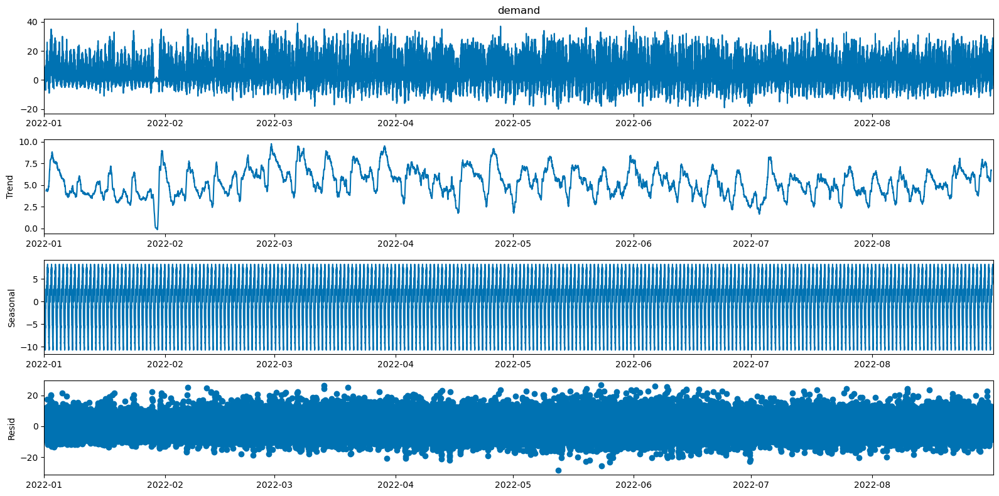

<Figure size 640x480 with 0 Axes>

In [38]:
# Plot the seasonal decompose for zone 138
seas_decom = seasonal_decompose(zone[138].loc['2022-01':'2022-08', 'demand'], model='additive', period=12*24)

fig = seas_decom.plot()
fig.set_size_inches((16, 8))
fig.tight_layout()
plt.show()
plt.savefig('./image/demand_138_seasonal_decompose.jpg')


Inference:

Takign Zone 138 as example, weaker weekly trend is seen. The residuals is lesser as the values of demand is reduced too since it is a smaller zone 

### Polar Scatter Plot for Zone Comparison

In [39]:
# To return zone name
def zone_name(ID):
    return geo_df[geo_df['LocationID'] == ID]['zone'].values[0]
    

In [40]:
# To plot 2 polar scatter plots side by side for comparison
def polar_plot(ID, ID2):
    # Compute areas
    zone[ID]['time'] = zone[ID].index.hour
    zone[ID]['hour_rad'] = zone[ID]['time'].apply(lambda t: np.deg2rad(t*15))
    zone[ID2]['time'] = zone[ID2].index.hour
    zone[ID2]['hour_rad'] = zone[ID2]['time'].apply(lambda t: np.deg2rad(t*15))
    

    fig = plt.figure(figsize = (8,6))
    gs = GridSpec(nrows=1, ncols=2, width_ratios=[1, 1])
    
    ax1 = fig.add_subplot(gs[0,0], projection='polar')
    ax1.scatter(zone[ID]['hour_rad'], zone[ID]['demand'], alpha=0.05)
    ax1.set_rlabel_position(55)
    ax1.set_xticks(np.linspace(0, 2*np.pi, 24, endpoint=False))
    ax1.set_rmin(-40)
    ax1.set_rmax(50)
    ax1.set_xticklabels(range(24))
    ax1.set_theta_direction(-1)
    ax1.set_theta_offset(np.pi/2.0)
    ax1.grid(color='b', linestyle='-', linewidth=0.1)
    ax1.set_title(f'Zone{ID} - {zone_name(ID)}')
    
    ax2 = fig.add_subplot(gs[0,1], projection='polar')
    ax2.scatter(zone[ID2]['hour_rad'], zone[ID2]['demand'], alpha=0.05, c = 'r')
    ax2.set_rlabel_position(55)
    ax2.set_xticks(np.linspace(0, 2*np.pi, 24, endpoint=False))
    ax2.set_rmin(-40)
    ax2.set_rmax(50)
    ax2.set_xticklabels(range(24))
    ax2.set_theta_direction(-1)
    ax2.set_theta_offset(np.pi/2.0)
    ax2.grid(color='b', linestyle='-', linewidth=0.1)
    ax2.set_title(f'Zone {ID2} - {zone_name(ID2)}')

    plt.suptitle('Taxi Demand by Hour')
    plt.show()
    
    return plt.savefig(f'./image/polar_plot_{ID}_{ID2}.jpg')
    

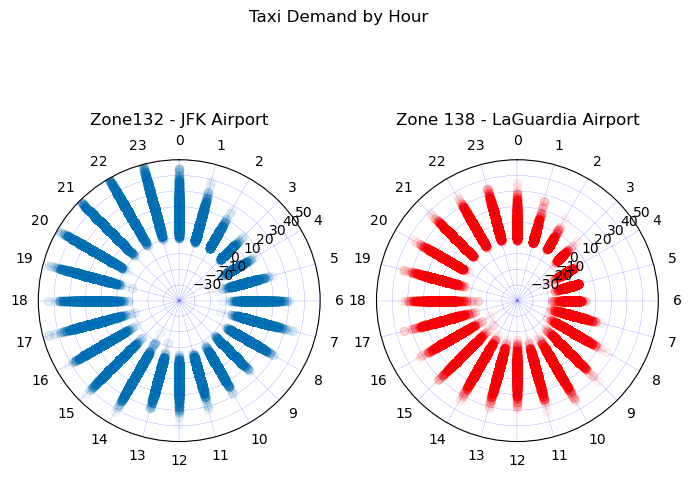

<Figure size 640x480 with 0 Axes>

In [41]:
polar_plot(132, 138)

Inference:

From the 2 scatter plots above, the demand for each zones are different and the timing of peaks are different too. The higher the value, the higher the demand of taxi as lesser taxi are entering this zone to drop off passengers.\
For Alphabet City, there are more demand around night time from 0000 to 0300. However, for Newark Airport, no significant positive demand peak is obserived. We could see Newark Airport has higher depand of dropping off passengers than picking up passengers to other borough in New York. Main reason of such different in peaks could be due to the purpose of the zone. For Alphabet City, it is a neighborhood with bars and restaurants which could contribute to more late night pick up

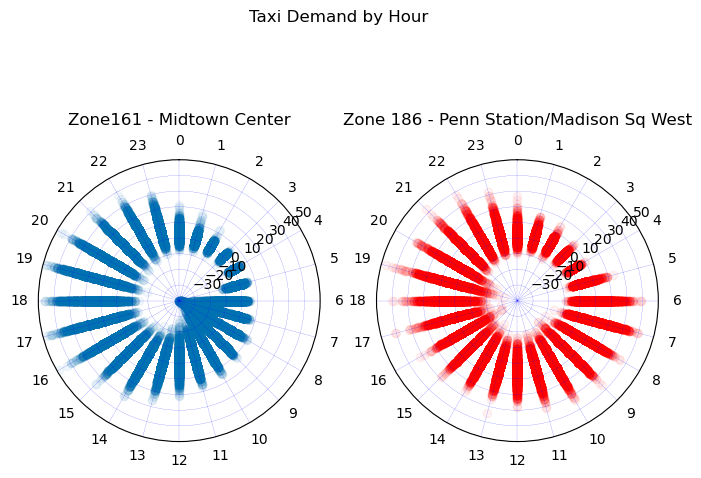

<Figure size 640x480 with 0 Axes>

In [42]:
polar_plot(161, 186)

Inference:

Midtown Manhattan is home to iconic attractions. At tourist area, eventually more dropping off will happen in the morning and the demand slowly turns higher throughout the day. This is a tourist travelling behaviour where they visit the place in the morning and will leave the area in the afternoon or evening.

Pennsylvania Station, also known as Penn Station, is the main intercity railroad station in New York City. Despite located at Manhattan Borough, same like Midtown Manhattan, the pick up demand beigns at 0500 and lasted thoughout the day untill 0000 the next day. This could be due to the train arrival timing and sicne Penn Station is one of the busiest station, the train arriving could be plenty.

# Data Exports 

## Neighborhood Weights

In [43]:
# Create Queen Contiguity Matrix weights by passing in geo_dataframe directly
# weights are created equally for all neighbor
zone_weight = weights.Queen.from_dataframe(geo_df, idVariable='zone') 
zone_weight.transform = 'R' 

('WARNING: ', 'Newark Airport', ' is an island (no neighbors)')
('WARNING: ', 'City Island', ' is an island (no neighbors)')
('WARNING: ', "Governor's Island/Ellis Island/Liberty Island", ' is an island (no neighbors)')
('WARNING: ', "Governor's Island/Ellis Island/Liberty Island_1", ' is an island (no neighbors)')
('WARNING: ', "Governor's Island/Ellis Island/Liberty Island_2", ' is an island (no neighbors)')
('WARNING: ', 'Roosevelt Island', ' is an island (no neighbors)')


Inference:
- There are 4 zones without neighbors whereby these zones do not share any boundaries with any other zone
- "Governor's Island/Ellis Island/Liberty Island" are islands in New York and there were no taxi making any trip to/from the islands
- Newark Airport is located at New Jersey which is adjacent to New York City. Hence, there is no common sharing of boundary with any zones in New York City. 
- Both City Island and Roosevelt Island are not sharing any boundary with other zones but conencted by bridge. Hence, the zone where bridges are connected to these 2 islands will be assigned with weights manually.

In [44]:
# To store the neighbor in dictionary for exporting 

# define an empty dictionary
neighbor_weight = {}
for item in zone_weight:
    neighbor_weight[item[0]]= item[1]
    
# Save the dictionary to text file
with open('./datasets/neighbor_weight.txt', 'w') as convert_file:
     convert_file.write(json.dumps(neighbor_weight))

In [45]:
with open('./datasets/neighbor_weight.txt') as weight:
    neighbor_w =  weight.read()

def neighbor(in_zone):
    neighbors = []
    for i in neighbor_weight[in_zone].keys():
        neighbors.append(i)
    return neighbors

## Identify the Zone based on Coordinate

In [46]:
# Return the Zone ID based on the Coordinate of the user
def in_coor(lon, lat):
    point = Point(lon, lat)
    in_zone = geo_df[geo_df['geometry'].contains(point)]['zone']
    
    return (in_zone.values[0])

In [47]:
in_zone = in_coor(-73.9510, 40.7605)
in_zone

'Roosevelt Island'

In [48]:
point = Point(-74.1503,40.5687)
geo_df['geometry']

0      POLYGON ((-74.18445 40.69500, -74.18449 40.695...
1      MULTIPOLYGON (((-73.82338 40.63899, -73.82277 ...
2      POLYGON ((-73.84793 40.87134, -73.84725 40.870...
3      POLYGON ((-73.97177 40.72582, -73.97179 40.725...
4      POLYGON ((-74.17422 40.56257, -74.17349 40.562...
                             ...                        
258    POLYGON ((-73.95834 40.71331, -73.95681 40.712...
259    POLYGON ((-73.85107 40.91037, -73.85207 40.909...
260    POLYGON ((-73.90175 40.76078, -73.90147 40.759...
261    POLYGON ((-74.01333 40.70503, -74.01327 40.704...
262    MULTIPOLYGON (((-73.94383 40.78286, -73.94376 ...
Name: geometry, Length: 263, dtype: geometry